Решение соревнования [Start in ML: code your FaceRec system (DL track)](https://www.kaggle.com/competitions/start-ml-dl-track).

# 1. Скачивание данных, установка и импорт библиотек

Используемые библиотеки:

* Insightface - https://github.com/deepinsight/insightface
* RetinaFace PyTorch - https://github.com/biubug6/Pytorch_Retinaface

In [1]:
%%time
%%capture
!pip install onnxruntime-gpu insightface retinaface_pytorch
!pip install "opencv-python-headless<4.3"

!cp -r "../input/insightface-project/recognition/arcface_torch" "./arcface_torch"

CPU times: user 448 ms, sys: 126 ms, total: 574 ms
Wall time: 1min 51s


In [20]:
from os import listdir, path
import random

import cv2
import numpy as np
import pandas as pd
from PIL import Image

import torch
from torch.nn import functional as F
from torchvision import transforms
from torchvision.ops import nms

import arcface_torch
from arcface_torch import backbones
from retinaface.box_utils import decode, decode_landm
from retinaface.network import RetinaFace
from retinaface.prior_box import priorbox
from insightface.utils.face_align import norm_crop

from tqdm.auto import tqdm
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns
import matplotlib.pyplot as plt

from warnings import filterwarnings
filterwarnings('ignore')

device = 'cuda:0'

# 2. Модели

Для загрузки изображений был написан класс FaceDataset, который также позволяет итерироваться по нему батчами.

In [3]:
def get_batches_from_list(l: list, batch_size: int):
    return [l[i:i + batch_size] for i in range(0, len(l), batch_size)]

class FaceDataset:
    def __init__(self, folder_path: str):
        self.folder_path = folder_path
        self.images_paths = []
        self.labels = []

        for image_file in sorted(listdir(folder_path)):
            image_path = path.join(folder_path, image_file)

            if image_file.find('label') == -1:
                # If image file name does not contain label
                label = -1
            else:
                label = int(image_file[
                    image_file.find('label')+5:image_file.find('.png')
                ])

            self.images_paths.append(image_path)
            self.labels.append(label)
        
        self.classes = list(set(self.labels))

    def __len__(self):
        return len(self.images_paths)

    def __getitem__(self, index):
        image_path = self.images_paths[index]
        image = Image.open(image_path).convert('RGB')

        label = self.labels[index]

        return image, label, image_path

    def get_class_indexes(self, label: str):
        assert label in self.labels

        indices = [
            i for i, label_i in enumerate(self.labels)
            if label_i == label
        ]

        return indices

    def get_images_batches(self, batch_size: int):
        indexes = list(range(len(self)))

        return FaceDatasetIterator(self, indexes, batch_size)

    def get_class_batches(self, label: str, batch_size: int):
        class_indexes = self.get_class_indexes(label)

        return FaceDatasetIterator(self, class_indexes, batch_size)

class FaceDatasetIterator:
    def __init__(self, dataset: FaceDataset, indexes: list, batch_size: int):
        self.dataset = dataset
        self.indexes = indexes
        self.batch_size = batch_size
        self.indexes_batches = get_batches_from_list(indexes, batch_size)
    
    def __len__(self):
        return len(self.indexes_batches)

    def __iter__(self):
        self.n = 0
        return self
    
    def __next__(self):
        if self.n < len(self.indexes_batches):
            images = []
            labels = []
            images_paths = []

            for index in self.indexes_batches[self.n]:
                image, label, image_path = self.dataset[index]
                images.append(image)
                labels.append(label)
                images_paths.append(image_path)

            self.n += 1

            return images, labels, images_paths
        else:
            raise StopIteration

Для детекции лиц был написан класс RetinaFaceTorch, который использует модель RetinaFace с backbone'ом ResNet50.

Ссылки:

* [GitHub](https://github.com/biubug6/Pytorch_Retinaface)
* [PyPi](https://pypi.org/project/retinaface-pytorch/)

In [4]:
ROUNDING_DIGITS = 2


class RetinaFaceTorch:
    def __init__(
            self, weights_path: str,
            size: tuple = (640, 640),
            nms_threshold: float = 0.4,
            size_threshold: float = 0.002,
            device: str = "cpu",
    ) -> None:
        self.model = RetinaFace(
            name="Resnet50",
            pretrained=False,
            return_layers={"layer2": 1, "layer3": 2, "layer4": 3},
            in_channels=256,
            out_channels=256,
        ).to(device)

        self.size = size
        self.nms_threshold = nms_threshold
        self.size_threshold = size_threshold
        self.device = device

        self.model.load_state_dict(
            torch.load(weights_path, map_location=self.device)
        )
        self.model.eval()

        self.variance = [0.1, 0.2]
        self.prior_box = priorbox(
            min_sizes=[[16, 32], [64, 128], [256, 512]],
            steps=[8, 16, 32],
            clip=False,
            image_size=self.size,
        ).to(self.device)

    def get_crops(self, images: list, rotations: list = [], confidence_threshold: float = 0.5):
        rotated_images, images_tensor = self.preprocess_batch(images, rotations)
        images_tensor = images_tensor.to(self.device)
        locs, confs, lands = self.model(images_tensor)
        faces = self.postprocess_batch(rotated_images, locs, confs, lands, confidence_threshold)

        crops = []
        detections = []

        for image_rotations, image_faces in zip(
            get_batches_from_list(rotated_images, 1 + len(rotations)),
            get_batches_from_list(faces, 1 + len(rotations))
        ):
            if image_faces.count(None) == len(image_faces):
                # Resize original image if no faces are detected
                crops.append(cv2.resize(np.array(image_rotations[0]), (112, 112)))
                detections.append(False)
            else:
                image_detections = list(map(lambda e: e is not None, image_faces))

                # Select face with the biggest score
                selected_face = image_faces[image_detections.index(True)]
                selected_image = image_rotations[image_detections.index(True)]
                for face, image in zip(image_faces, image_rotations):
                    if (face is not None) and (face['score'] > selected_face['score']):
                        selected_face = face
                        selected_image = image

                # Extract aligned crop
                crop = norm_crop(
                    np.array(selected_image),
                    np.float32(selected_face['landmarks']),
                    image_size=112,
                )
                crops.append(crop)
                detections.append(True)

        return crops, detections

    def preprocess_batch(self, images: list, rotations: list):
        rotated_images = []
        transformed_images = []
        for image in images:
            # Rotate image
            image_rotations = [
                image,
                *[
                    transforms.functional.rotate(image, rotation)
                    for rotation in rotations
                ]
            ]
            rotated_images.extend(image_rotations)
            # Transform image
            for image_rotation in image_rotations:
                transformed_image = cv2.resize(np.float32(image_rotation), self.size)
                transformed_image = np.transpose(transformed_image, (2, 0, 1))
                transformed_images.append(transformed_image)

        images_tensor = torch.from_numpy(np.stack(transformed_images, 0))
        return rotated_images, images_tensor

    def postprocess_batch(self, images, locs, confs, lands, confidence_threshold: float):
        faces = []

        with torch.no_grad():
            confs = F.softmax(confs, dim=-1)

            scale_landmarks = torch.from_numpy(np.tile(self.size, 5)).to(self.device)
            scale_bboxes = torch.from_numpy(np.tile(self.size, 2)).to(self.device)

            for image, loc, conf, land in zip(images, locs, confs, lands):
                original_height, original_width = np.array(image).shape[:2]
                original_size = (original_width, original_height)

                boxes = decode(loc.data, self.prior_box, self.variance)
                boxes *= scale_bboxes

                scores = conf[:, 1]

                landmarks = decode_landm(land.data, self.prior_box, self.variance)
                landmarks *= scale_landmarks

                # ignore low scores
                valid_index = torch.where(scores > confidence_threshold)[0]
                boxes = boxes[valid_index]
                landmarks = landmarks[valid_index]
                scores = scores[valid_index]

                # do NMS
                keep = nms(boxes, scores, self.nms_threshold)
                boxes = boxes[keep, :]

                if boxes.shape[0] == 0:
                    faces.append(None)
                    continue

                landmarks = landmarks[keep]

                scores = scores[keep].cpu().numpy().astype(float)

                boxes_np = boxes.cpu().numpy()
                landmarks_np = landmarks.cpu().numpy()
                bbox_resize_coeff = np.tile(np.array(original_size) / np.array(self.size), 2)
                landmark_resize_coeff = np.tile(np.array(original_size) / np.array(self.size), 5)

                boxes_np *= bbox_resize_coeff
                landmarks_np = landmarks_np.reshape(-1, 10) * landmark_resize_coeff

                image_faces = []
                for box_id, bbox in enumerate(boxes_np):
                    x_min, y_min, x_max, y_max = bbox

                    x_min = np.clip(x_min, 0, original_width - 1)
                    x_max = np.clip(x_max, x_min + 1, original_width - 1)

                    if x_min >= x_max:
                        continue

                    y_min = np.clip(y_min, 0, original_height - 1)
                    y_max = np.clip(y_max, y_min + 1, original_height - 1)

                    if y_min >= y_max:
                        continue

                    crop_size = (x_max - x_min) * (y_max - y_min)
                    image_size = original_width * original_height
                    if crop_size / image_size < self.size_threshold:
                        continue

                    image_faces.append({
                        "bbox": np.round(bbox.astype(float), ROUNDING_DIGITS).tolist(),
                        "score": np.round(scores, ROUNDING_DIGITS)[box_id],
                        "landmarks": np.round(landmarks_np[box_id].astype(float), ROUNDING_DIGITS)
                            .reshape(-1, 2)
                            .tolist(),
                    })

                # Leave face with the biggest score, if multiple are detected
                best_image_face = image_faces[0]
                for image_face in image_faces:
                    if image_face['score'] > best_image_face['score']:
                        best_image_face = image_face

                faces.append(best_image_face)

        return faces

Для построения эмбеддингов был написан класс ArcFaceTorch, который использует модель iResNet50, обученную с функцией потерь ArcFace.

[Ссылка на GitHub](https://github.com/deepinsight/insightface/tree/master/recognition/arcface_torch)

In [23]:
class ArcFaceTorch:
    def __init__(self, weights_path: str, device: str = 'cpu'):
        self.model = arcface_torch.backbones.get_model('r50').to(device)
        self.device = device

        self.model.load_state_dict(
            torch.load(weights_path, map_location=self.device)
        )
        self.model.eval()

    def get_embeddings(self, images: list, augmentations: list = [],):
        images_tensor = self.preprocess_batch(images, augmentations).to(self.device)
        embeddings_tensor = self.model(images_tensor).cpu().detach().numpy()
        images_info = self.postprocess_batch(embeddings_tensor, augmentations)
        return images_info

    def preprocess_batch(self, images: list, augmentations: list):
        transformed_images = []
        for image in images:
            # Transform original image
            transformed_image = np.transpose(np.float32(image), (2, 0, 1))
            transformed_image = (transformed_image / 255 - 0.5) / 0.5
            transformed_images.append(transformed_image)

            # Transform augmented image
            pil_image = Image.fromarray(image)
            for augmentation in augmentations:
                transformed_image = augmentation(pil_image)
                transformed_image = np.transpose(np.float32(transformed_image), (2, 0, 1))
                transformed_image = (transformed_image / 255 - 0.5) / 0.5
                transformed_images.append(transformed_image)
        images_tensor = torch.from_numpy(np.stack(transformed_images, 0))
        return images_tensor

    def postprocess_batch(self, embeddings_tensor, augmentations: list):
        embeddings_list = list(embeddings_tensor)
        embeddings = []

        for i in range(0, len(embeddings_list), len(augmentations) + 1):
            mean_embedding = np.mean(
                [
                    embeddings_list.pop(0)
                    for j in range(len(augmentations) + 1)
                ],
                axis=0
            )

            embeddings.append(mean_embedding)

        return embeddings

# 3. Деткция лиц на тренировочных изображениях

Посмотрим на несколько изображений из тренировочных данных.

В каждом столбце располагаются изображения одного класса.

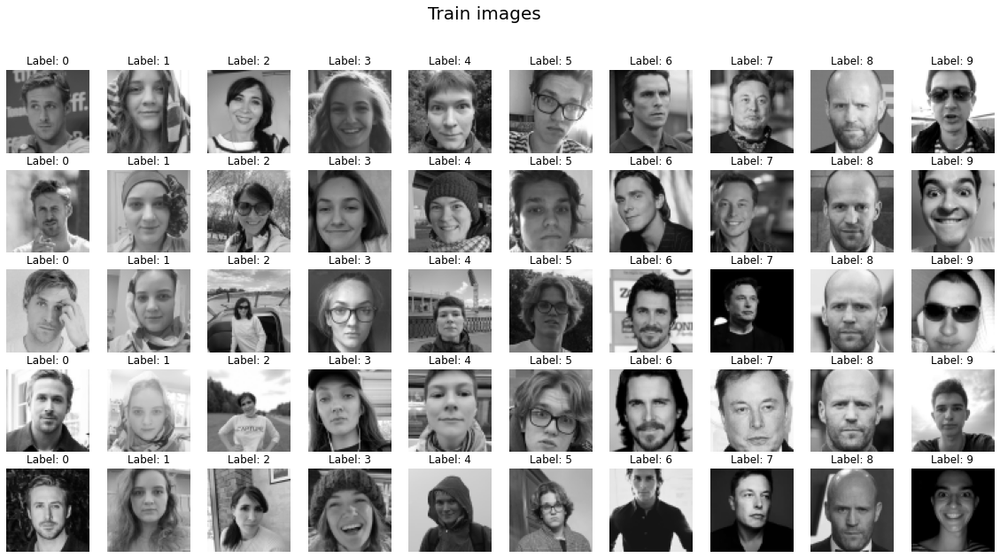

In [6]:
train_dataset = FaceDataset('../input/start-ml-dl-track/DL_track_train')

fig, axes = plt.subplots(5, 10, figsize=(20, 10))
plt.suptitle('Train images', fontsize=20)

for class_label in range(10):
    class_indexes = train_dataset.get_class_indexes(class_label)[:5]

    for i, dataset_index in enumerate(class_indexes):
        image, label, _ = train_dataset[dataset_index]

        axes[i][class_label].imshow(image)
        axes[i][class_label].set_title(f'Label: {label}')
        axes[i][class_label].axis('off')

Создадим модель для детекции лиц с предобученными весами.

[Ссылка на файл с весами (файл Resnet50_Final.pth)](https://drive.google.com/drive/folders/1oZRSG0ZegbVkVwUd8wUIQx8W7yfZ_ki1)

In [7]:
detection_model = RetinaFaceTorch(
    weights_path='../input/facerec-pretrained-weights/detection_model_weights.pth',
    size=(256, 256),
    device=device
)

Модель RetinaFace помимо bounding box'a для лица возвращает ещё и 5 опорных точек (центр носа, кончики губ, глаза). Используя эти точки можно центрировать кроп лица и вырвонять его наклон.

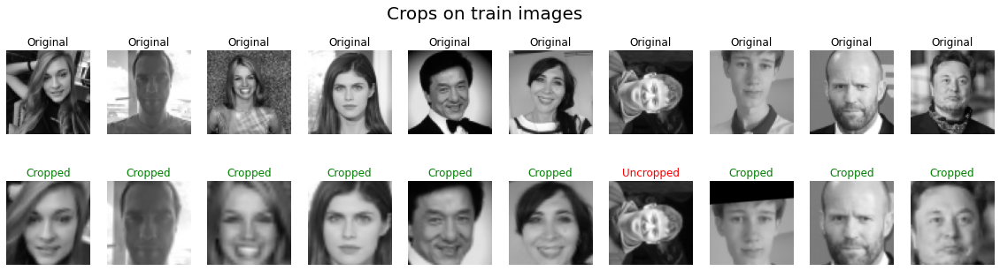

In [8]:
fig, axes = plt.subplots(2, 10, figsize=(20, 5))
plt.suptitle('Crops on train images', fontsize=20)

for i in range(10):
    image, label, _ = train_dataset[i]
    crop, detection = detection_model.get_crops([image], confidence_threshold=0.9)

    axes[0][i].imshow(image)
    axes[0][i].set_title('Original')
    axes[0][i].axis('off')

    axes[1][i].imshow(crop[0])
    axes[1][i].set_title(
        'Cropped' if detection[0] else 'Uncropped',
        color='green' if detection[0] else 'red'
    )
    axes[1][i].axis('off')

Видим, что в тренировочных данных есть перевернутые фотографии, на которых модель детекции не находит лица.

Посмотрим на долю изображений с найденными лицами для каждого класса.

  0%|          | 0/49 [00:00<?, ?it/s]

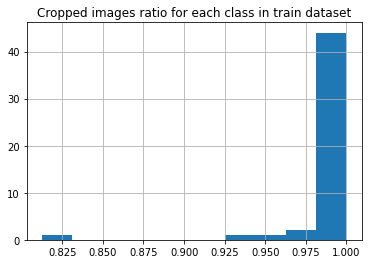

In [9]:
crops_df = pd.DataFrame({'class': [], 'images_num': [], 'cropped_num': [], 'uncropped_num': []})

for class_label in tqdm(train_dataset.classes):
    images_num = 0
    cropped_num = 0
    for images, _, _ in train_dataset.get_class_batches(class_label, batch_size=8):
        crops, detections = detection_model.get_crops(images, confidence_threshold=0.9)
        images_num += len(crops)
        cropped_num += sum(detections)
    
    uncropped_num = images_num - cropped_num

    crops_df = crops_df.append({
        'class': class_label,
        'images_num': images_num,
        'cropped_num': cropped_num,
        'uncropped_num': uncropped_num,
    }, ignore_index=True)

crops_df['cropped_ratio'] = crops_df['cropped_num'] / crops_df['images_num']

plt.title('Cropped images ratio for each class in train dataset')
crops_df['cropped_ratio'].hist();

В принципе, можно просто игнорировать те изображения, на которых лицо не найдено, так как наименьшая доля изображений с найденными лицом всего 0.825 (7 из 8).

Можно попытаться решить проблему с перевернутыми лицами. Для этого вместо поиска лица только на оригинальном изображении будем искать его ещё и на повернутых на 90, 180 и 270 градусов изображениях. Если было найдено несколько лиц, будем выбирать только то, которое имеет наибольший score (уверенность модели).

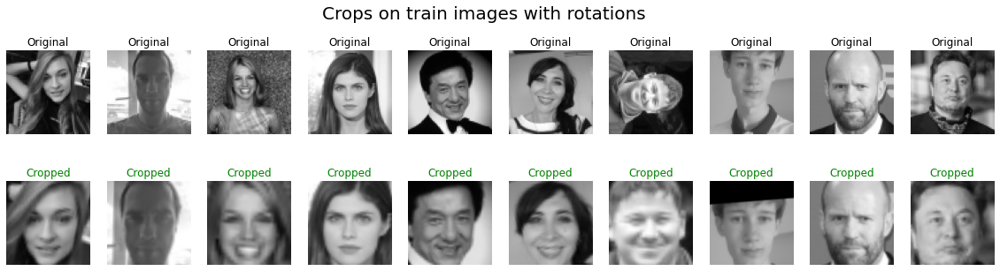

In [10]:
fig, axes = plt.subplots(2, 10, figsize=(20, 5))
plt.suptitle('Crops on train images with rotations', fontsize=20)

for i in range(10):
    image, label, _ = train_dataset[i]
    crop, detection = detection_model.get_crops(
        [image],
        rotations=[90, 180, 270],
        confidence_threshold=0.9
    )

    axes[0][i].imshow(image)
    axes[0][i].set_title('Original')
    axes[0][i].axis('off')

    axes[1][i].imshow(crop[0])
    axes[1][i].set_title(
        'Cropped' if detection[0] else 'Uncropped',
        color='green' if detection[0] else 'red'
    )
    axes[1][i].axis('off')

Видим, что теперь на всех 10 изображениях были найдены лица.

Посмотрим на долю изображений с найденными лицами для каждого класса ещё раз.

  0%|          | 0/49 [00:00<?, ?it/s]

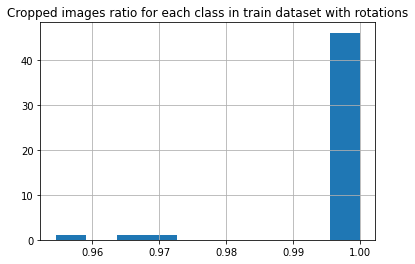

In [11]:
crops_df = pd.DataFrame({'class': [], 'images_num': [], 'cropped_num': [], 'uncropped_num': []})

for class_label in tqdm(train_dataset.classes):
    images_num = 0
    cropped_num = 0
    for images, _, _ in train_dataset.get_class_batches(class_label, batch_size=8):
        crops, detections = detection_model.get_crops(
            images,
            rotations=[90, 180, 270],
            confidence_threshold=0.9
        )
        images_num += len(crops)
        cropped_num += sum(detections)
    
    uncropped_num = images_num - cropped_num

    crops_df = crops_df.append({
        'class': class_label,
        'images_num': images_num,
        'cropped_num': cropped_num,
        'uncropped_num': uncropped_num,
    }, ignore_index=True)

crops_df['cropped_ratio'] = crops_df['cropped_num'] / crops_df['images_num']

plt.title('Cropped images ratio for each class in train dataset with rotations')
crops_df['cropped_ratio'].hist();

Видим, что ещё осталось около трех классов, где есть изображения, на которых не удалось найти лица.

Так как доля таких изображений очень мала и, скорее всего, построенные эмбеддинги таких лиц будут плохими (непохожими на остальные), я решил просто не учитывать такие изображения при построении центроидов классов.

# 4. Детекция лиц на тестовых изображениях

Посмотрим на несколько изображений из тестовых данных.

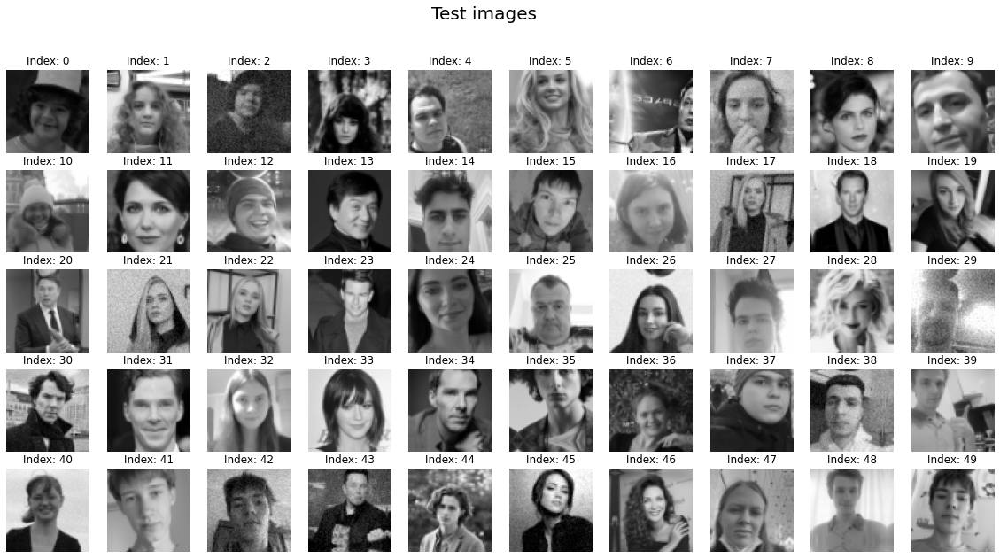

In [12]:
test_dataset = FaceDataset('../input/start-ml-dl-track/DL_track_test')

fig, axes = plt.subplots(5, 10, figsize=(20, 10))
plt.suptitle('Test images', fontsize=20)

for i in range(5*10):
    image, _, _ = test_dataset[i]
    
    axes[i//10][i%10].imshow(image)
    axes[i//10][i%10].set_title(f'Index: {i}')
    axes[i//10][i%10].axis('off')

Среди них есть несколько зашумленных изображений, но остальные не сильно отличаются от тренировочных.

Попробуем найти лица на всех изображениях и выведем те, на которых их найти не удалось.

  0%|          | 0/22060 [00:00<?, ?it/s]

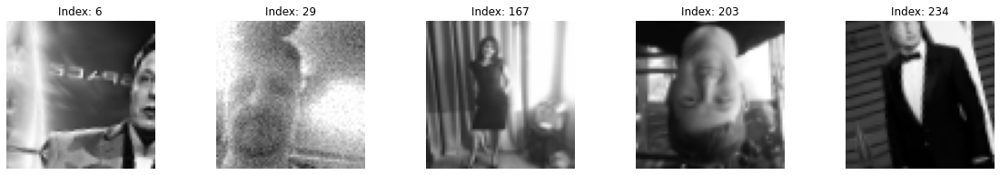

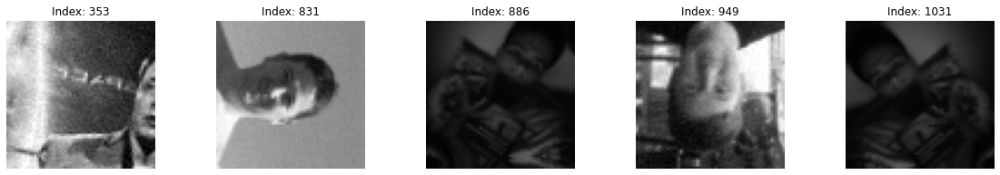

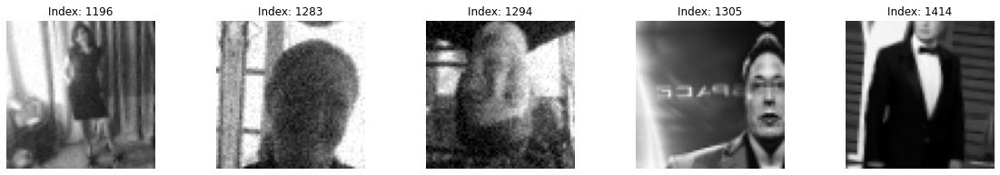

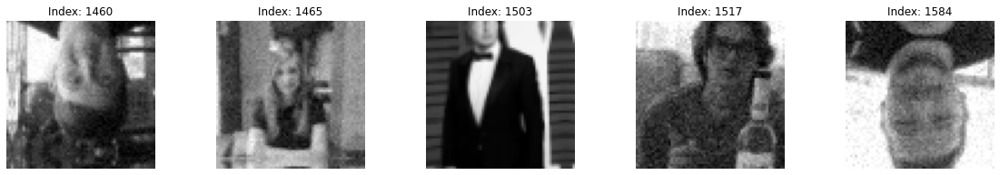

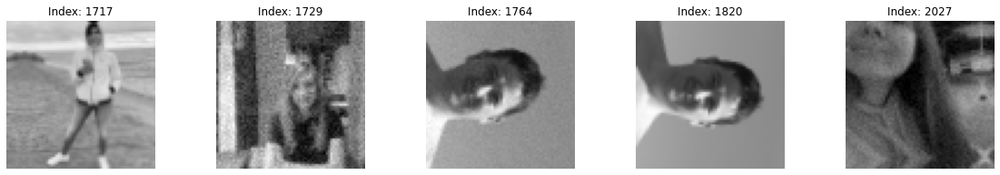

...

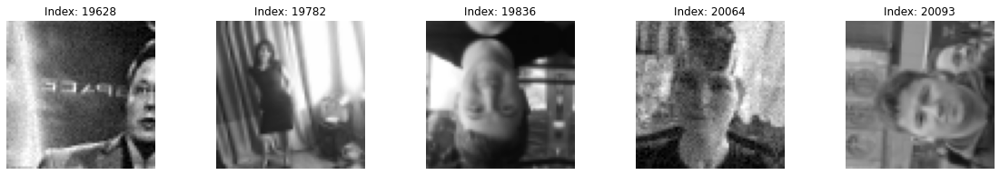

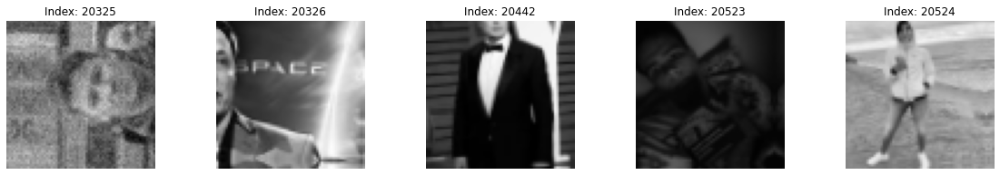

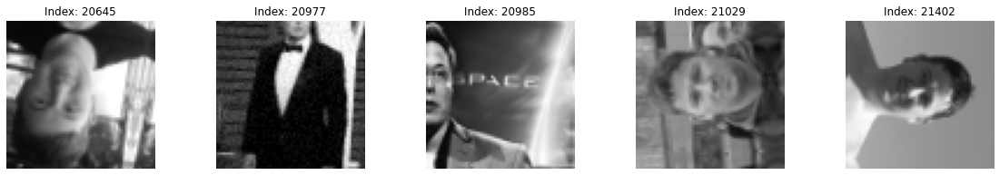

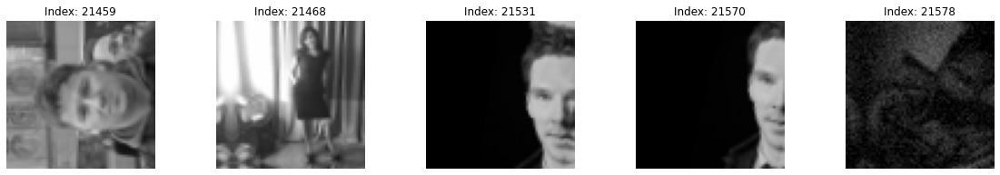

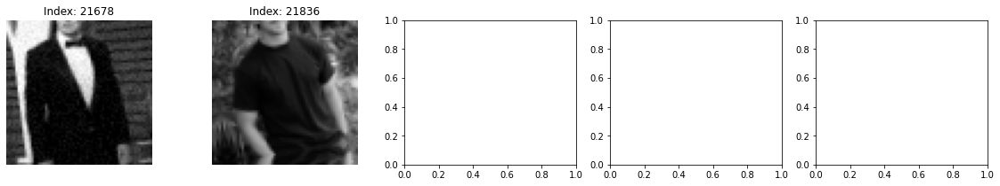

In [13]:
uncropped_count = 0
uncropped_indexes = []

for i in tqdm(range(len(test_dataset))):
    image, _, _ = test_dataset[i]
    crop, detection = detection_model.get_crops([image], confidence_threshold=0.9)

    if not detection[0]:
        if uncropped_count % 5 == 0:
            if uncropped_count > 0:
                plt.show()
            fig, axes = plt.subplots(1, 5, figsize=(20, 3))

        axes[uncropped_count%5].imshow(image)
        axes[uncropped_count%5].set_title(f'Index: {i}')
        axes[uncropped_count%5].axis('off')

        uncropped_count += 1
        uncropped_indexes.append(i)

In [14]:
print(f'Number of uncropped images: {uncropped_count}')

Number of uncropped images: 227


На 227 тестовых изображениях не удалось найти лицо.

Их можно разделить на 4 группы:

1. Перевернутые изображения
2. Зашумленные изображения
3. Изображения с обрезанным лицом
4. Изображения, на которых лицо занимает мало места

Для первой группы можно так же, как и для тренировочных данных, искать лица на перевернутых изображених.

Для того, чтобы найти лица на остальных изображениях можно понизить порог уверенности модели детекции. Это поможет находить лица, но вряд ли поможет построить для них хорошие эмбеддинги, из-за чего предсказания для таких изображений, скорее всего, будут ошибочными.

Посмотрим, на каких изображениях модель найдет лица, если добавить повороты и понизить порог.

  0%|          | 0/227 [00:00<?, ?it/s]

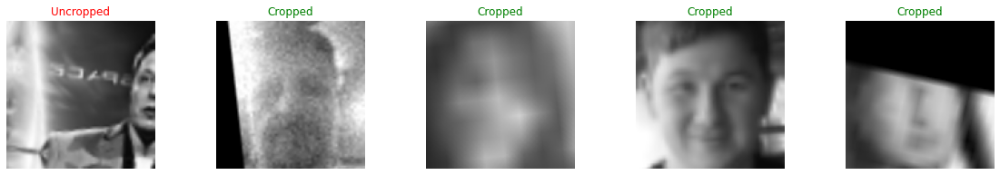

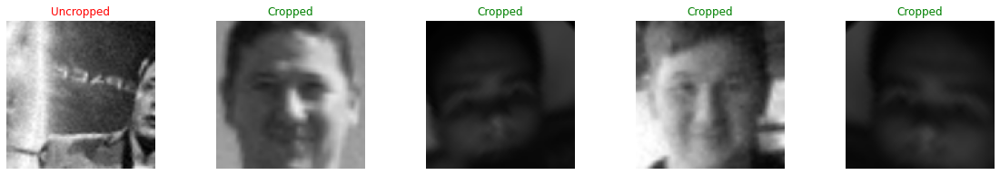

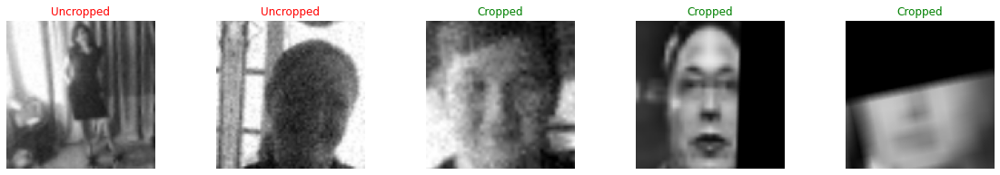

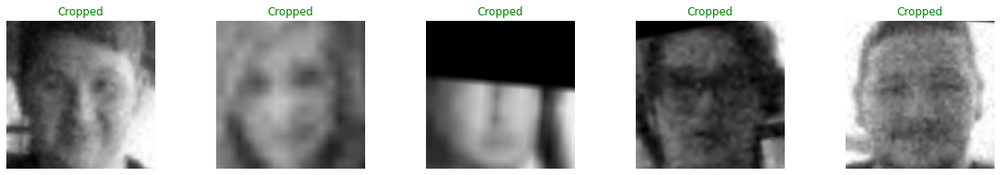

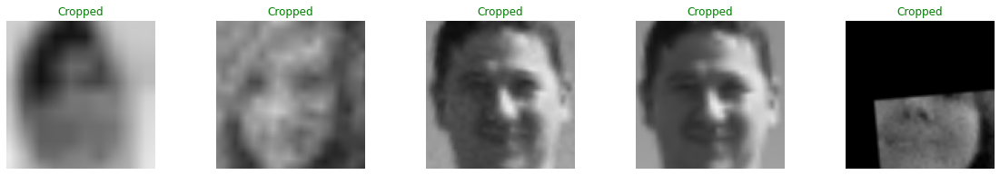

...

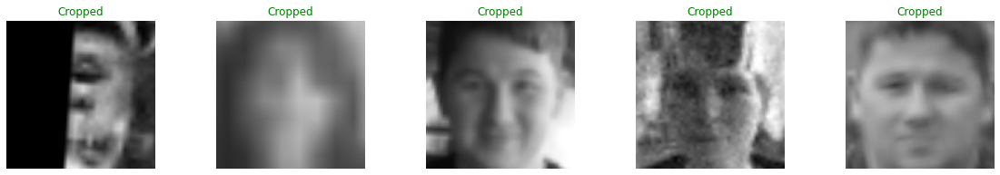

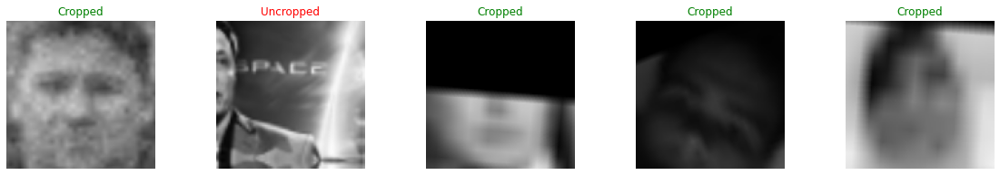

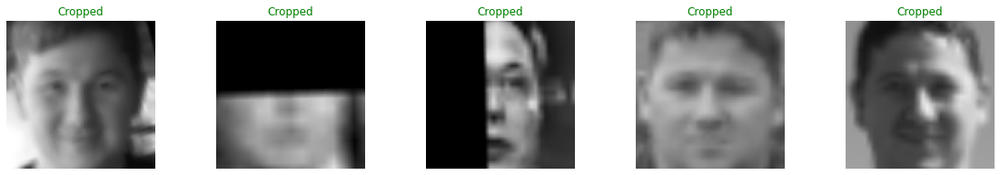

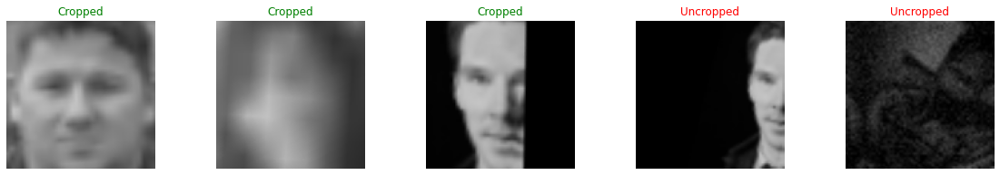

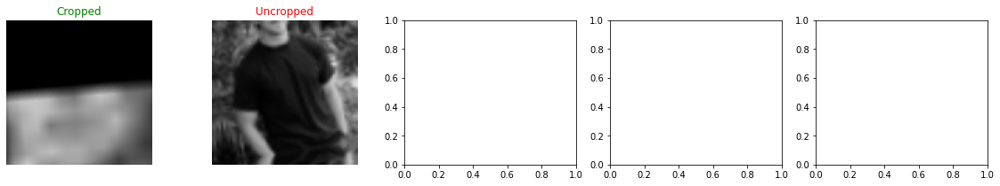

In [15]:
uncropped_count = 0

for i, uncropped_index in enumerate(tqdm(uncropped_indexes)):
    image, _, _ = test_dataset[uncropped_index]
    crop, detection = detection_model.get_crops(
        [image],
        rotations=[90, 180, 270],
        confidence_threshold=0.1
    )

    if i % 5 == 0:
        if i > 0:
            plt.show()
        fig, axes = plt.subplots(1, 5, figsize=(20, 3))
    
    axes[i%5].imshow(crop[0])
    axes[i%5].set_title(
        label='Cropped' if detection[0] else 'Uncropped',
        color='green' if detection[0] else 'red',
    )
    axes[i%5].axis('off')

    if not detection[0]:
        uncropped_count += 1

In [16]:
print(f'Number of uncropped images: {uncropped_count}')

Number of uncropped images: 37


После добавления поворотов и понижения порога осталось всего 37 изображений, на которых лицо не найдено.

Такие изображения для модели построения эмбеддингов будем подавать необрезанными.

# 5. Построение центроидов классов

Для построения центроидов классов будем использовать аугментации.

In [17]:
augmentations_dict = {
    'horizontal_flip': transforms.RandomHorizontalFlip(p=1),
    'color_jitter': transforms.ColorJitter(
        brightness=0.5,
        contrast=0.7,
        saturation=0.7,
    ),
    'posterize': transforms.RandomPosterize(bits=4, p=1),
    'sharpness': transforms.RandomAdjustSharpness(sharpness_factor=2, p=1),
    'blur': transforms.RandomAdjustSharpness(sharpness_factor=0, p=1),
}

Визуализируем выбранные аугментации на нескольких изображениях.

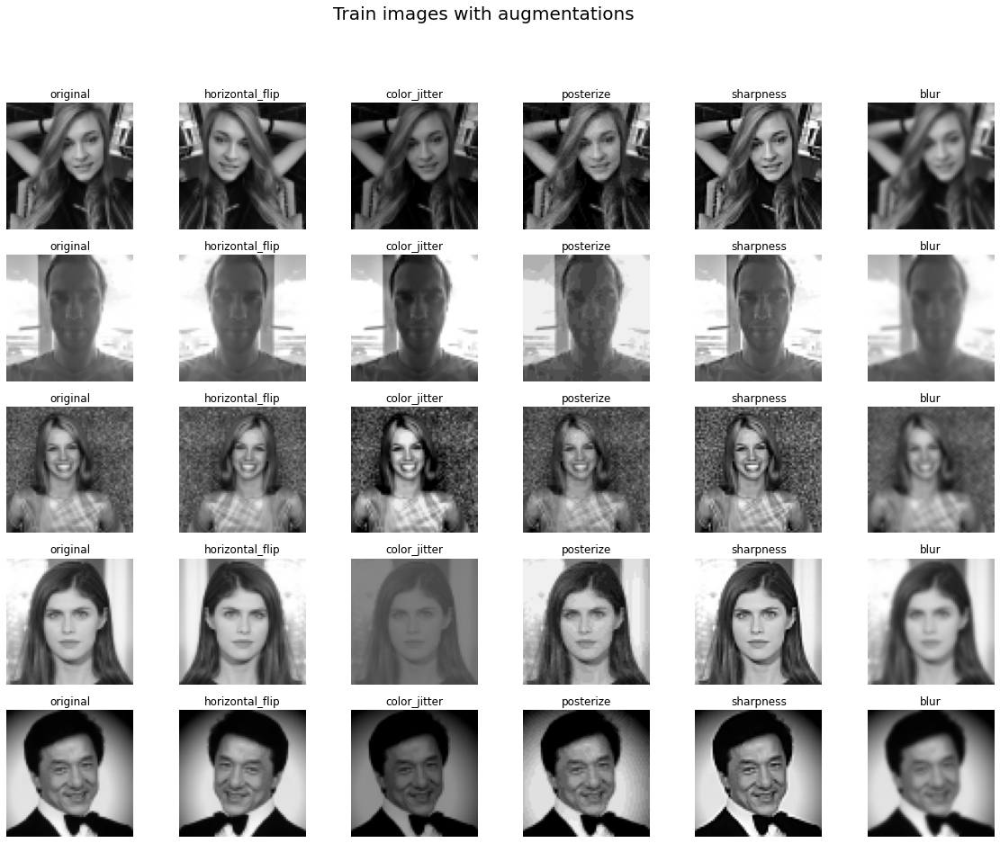

In [18]:
fig, axes = plt.subplots(5, len(augmentations_dict) + 1, figsize=(20, 15))
plt.suptitle('Train images with augmentations', fontsize=20)

for i in range(5):
    image, label, _ = train_dataset[i]

    axes[i][0].imshow(image)
    axes[i][0].set_title('original')
    axes[i][0].axis('off')
    
    for j, (augmentation_name, augmentation) in enumerate(augmentations_dict.items()):
        axes[i][j+1].imshow(augmentation(image))
        axes[i][j+1].set_title(augmentation_name)
        axes[i][j+1].axis('off')

Создадим модель для построения эмбеддингов с предобученными весами.

[Ссылка на файл с весами (файл backbone.pth)](https://onedrive.live.com/?authkey=%21AFZjr283nwZHqbA&id=4A83B6B633B029CC%215583&cid=4A83B6B633B029CC)

In [24]:
recognition_model = ArcFaceTorch(
    weights_path='../input/facerec-pretrained-weights/recognition_model_weights.pth',
    device=device,
)

Построим эмбеддинги для всех изображений с учетом аугментаций и усредним их для каждого класса, чтобы получить центроиды.

In [25]:
centroids = {}

for class_label in tqdm(train_dataset.classes):
    embeddings = []

    for images, _, _ in train_dataset.get_class_batches(class_label, batch_size=8):
        crops, detections = detection_model.get_crops(
            images,
            rotations=[90, 180, 270],
            confidence_threshold=0.9,
        )
        # Filter only detected crops
        crops = [crop for crop, detection in zip(crops, detections) if detection]
        embeddings.extend(recognition_model.get_embeddings(
            crops,
            augmentations=list(augmentations_dict.values()),
        ))

    centroids[class_label] = np.mean(embeddings, axis=0)

  0%|          | 0/49 [00:00<?, ?it/s]

# 6. Предсказания для тестовых данных

Для предсказания классов будем вычислять эмбеддинги лиц на тестовых изображениях и сравнивать их с центроидами классов по метрике косинусного сходства (cosine similarity). Предсказанием для лица на изображении будет тот класс, для которого метрика сходства с эмбеддингом максимальна.

Визуализируем матрицу сравнений для первого батча.

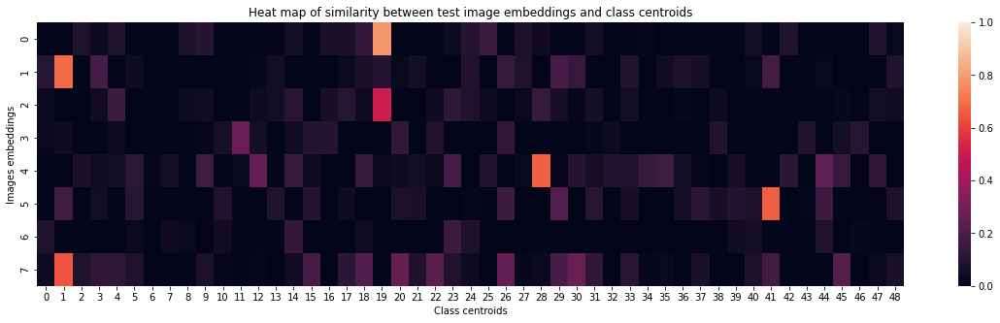

In [26]:
images = []
for i in range(8):
    image, _, _ = test_dataset[i]
    images.append(image)

crops, detections = detection_model.get_crops(
    images,
    rotations=[90, 180, 270],
    confidence_threshold=0.1
)

embeddings = recognition_model.get_embeddings(crops)

similarity_matrix = cosine_similarity(list(centroids.values()), embeddings)

fig, ax = plt.subplots(figsize=(20, 5))
sns.heatmap(similarity_matrix.T, vmin=0, vmax=1, ax=ax)
plt.xlabel('Class centroids')
plt.ylabel('Images embeddings')
plt.title('Heat map of similarity between test image embeddings and class centroids');

Чем ярче клетка на пересечении эмбеддинга и центроида, тем эмбеддинг более похож на цетроид.

Видим, что для всех изображений кроме 4 и 7 есть очень похожие центроиды.

Выведем тестовые изображения и по 3 примера изображений из предсказанного класса.

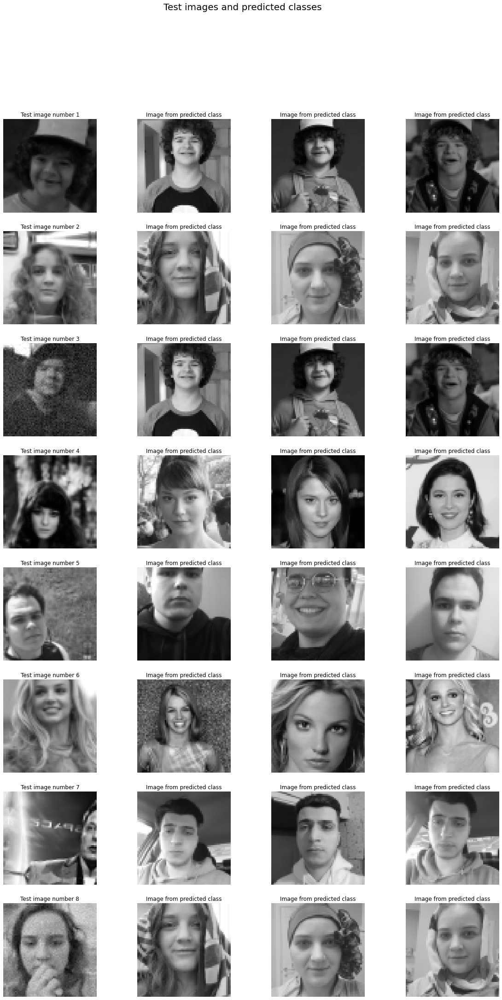

In [28]:
predicted_labels = similarity_matrix.argmax(axis=0).tolist()

fig, axes = plt.subplots(8, 4, figsize=(20, 35))
plt.suptitle('Test images and predicted classes', fontsize=20)

for i in range(8):
    test_image, _, _ = test_dataset[i]
    train_images = []
    for j in train_dataset.get_class_indexes(predicted_labels[i])[:3]:
        train_image, _, _ = train_dataset[j]
        train_images.append(train_image)
    
    axes[i][0].imshow(test_image)
    axes[i][0].set_title(f'Test image number {i+1}')
    axes[i][0].axis('off')
    
    for j, train_image in enumerate(train_images):
        axes[i][j+1].imshow(train_image)
        axes[i][j+1].set_title('Image from predicted class')
        axes[i][j+1].axis('off')

Видим, что лицо из тестового изображения 7 явно не похоже на лица из предсказанного класса.

Сделаем предсказания для всех тестовых изображений.

In [29]:
predictions = {}

for images, _, images_paths in tqdm(test_dataset.get_images_batches(batch_size=8)):
    crops, detections = detection_model.get_crops(
        images,
        rotations=[90, 180, 270],
        confidence_threshold=0.1
    )

    embeddings = recognition_model.get_embeddings(crops)

    similarity_matrix = cosine_similarity(list(centroids.values()), embeddings)
    predicted_labels = similarity_matrix.argmax(axis=0).tolist()
    
    for image_path, predicted_label in zip(images_paths, predicted_labels):
        image_file_name = path.basename(image_path)
        predictions[image_file_name] = predicted_label

  0%|          | 0/2758 [00:00<?, ?it/s]

Сохраним предсказания в CSV файл

In [30]:
submission_df = pd.DataFrame({'img_name': [], 'pred_class': []})

for img_name, pred_class in tqdm(predictions.items()):
    submission_df = submission_df.append({
        'img_name': img_name,
        'pred_class': pred_class,
    }, ignore_index=True)

submission_df = submission_df.astype({'pred_class': 'int'})
submission_df.to_csv('submission.csv', index=False)

  0%|          | 0/22060 [00:00<?, ?it/s]